In [1]:
import torch
from diffusers import StableDiffusionXLPipeline
from PIL import Image

from ip_adapter import IPAdapterPlusXL
from ip_adapter.custom_pipelines import StableDiffusionXLCustomPipeline

In [2]:
base_model_path = "stabilityai/stable-diffusion-xl-base-1.0"
image_encoder_path = "models/image_encoder"
ip_ckpt = "sdxl_models/ip-adapter-plus-face_sdxl_vit-h.bin" # a experimental version
device = "cuda"

In [3]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [4]:
# load SDXL pipeline
pipe = StableDiffusionXLCustomPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    add_watermarker=False,
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [5]:
# load ip-adapter
ip_model = IPAdapterPlusXL(pipe, image_encoder_path, ip_ckpt, device, num_tokens=16)

## Generate Image conditioned on face images
- You should use a cropped face image (you can the adjust the cropped area size to get different results)
- Since the background will have an impact on the resulting image, you'd better segment the face

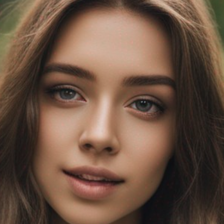

In [6]:
# case 1
image = Image.open("assets/images/ai_face.png")
image.resize((224, 224))

  0%|          | 0/30 [00:00<?, ?it/s]

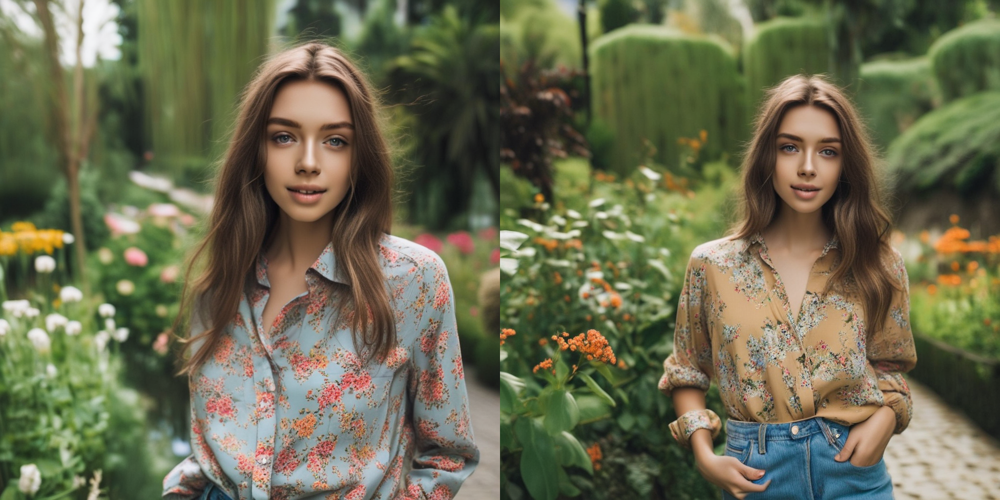

In [7]:
images = ip_model.generate(pil_image=image, num_samples=2, num_inference_steps=30, seed=42,
        prompt="photo of a beautiful girl wearing casual shirt in a garden")
grid = image_grid(images, 1, 2)
grid

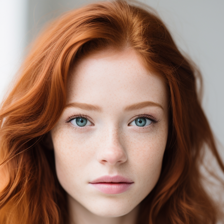

In [8]:
# case 2
image = Image.open("assets/images/ai_face2.png")
image.resize((224, 224))

  0%|          | 0/30 [00:00<?, ?it/s]

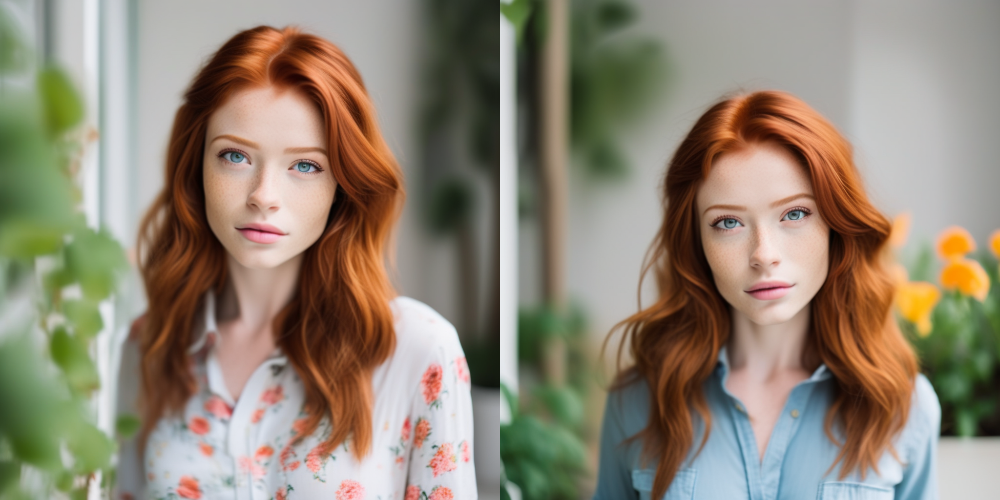

In [9]:
images = ip_model.generate(pil_image=image, num_samples=2, num_inference_steps=30, seed=42,
        prompt="photo of a beautiful girl wearing casual shirt in a garden")
grid = image_grid(images, 1, 2)
grid

## Post-Conditioning
Use post-condition to generate more diverse images (like inpainting but you don't draw mask)

  0%|          | 0/30 [00:00<?, ?it/s]

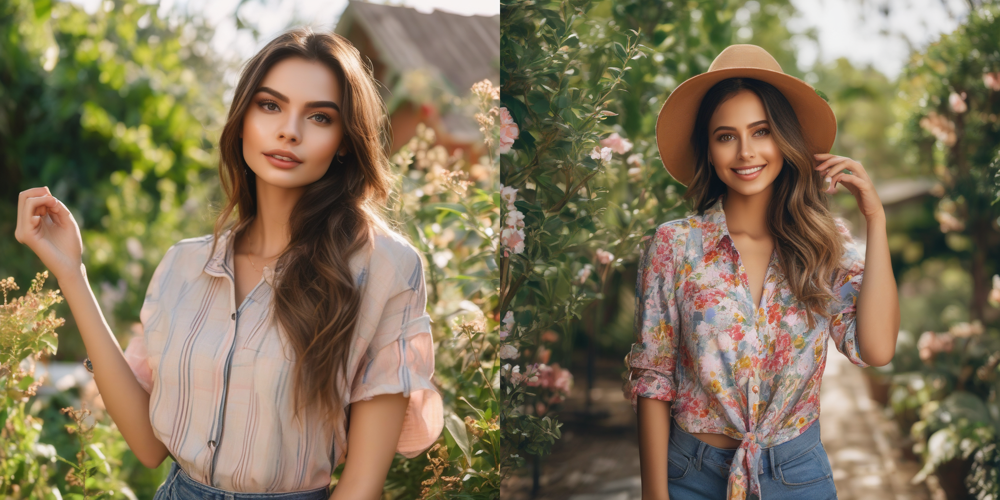

In [10]:
# generate the image only conditioned text
images = ip_model.generate(pil_image=image, num_samples=2, num_inference_steps=30, seed=2023,
        prompt="photo of a beautiful girl wearing casual shirt in a garden", control_guidance_start=1.)
grid = image_grid(images, 1, 2)
grid

  0%|          | 0/30 [00:00<?, ?it/s]

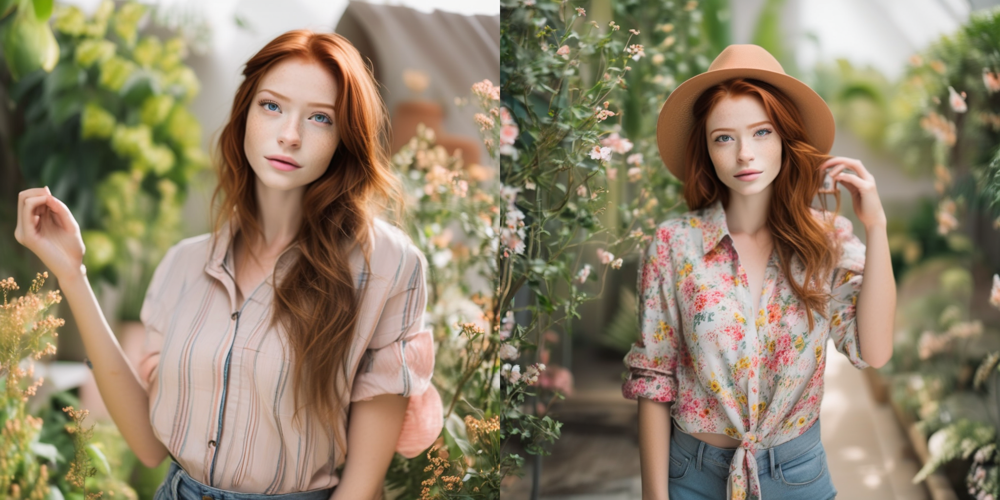

In [11]:
# add face image condition
images = ip_model.generate(pil_image=image, num_samples=2, num_inference_steps=30, seed=2023,
        prompt="photo of a beautiful girl wearing casual shirt in a garden", control_guidance_start=0.5)
grid = image_grid(images, 1, 2)
grid